# PLANT DISEASE DETECTION

## Import Library

In [ ]:
# TensorFlow and Keras - Core libraries for building and training neural networks
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential, load_model, Model
from tensorflow.keras.applications import ResNet50, VGG16
from tensorflow.keras.layers import Input, ZeroPadding2D, Conv2D, BatchNormalization, GlobalAveragePooling2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Standard Libraries - Built-in libraries for file handling and operations
import os
import zipfile
import pickle
import shutil

# OpenCV - Library for image processing
import cv2

# Data Manipulation and Visualization - Libraries for handling and visualizing data
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, hamming_loss, precision_score, recall_score, f1_score, classification_report
import itertools

# Tabulate - Library for creating formatted tables
from tabulate import tabulate

# Ensure matplotlib can be used within the notebook
%matplotlib inline

## Extracting the Dataset

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define the path to the zip file in Google Drive
zip_file_path = '/content/drive/MyDrive/plant_disease_datasets.zip'

# Define the base directory where you want to extract the files
base_extract_dir = '/content/plants_disease_datasets'

# Create the base directory if it doesn't exist
os.makedirs(base_extract_dir, exist_ok=True)

# Unzip the dataset
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(base_extract_dir)

# Print confirmation
print("Extraction complete!")

Mounted at /content/drive
Extraction complete!


In [ ]:
# Define paths for Train, Test, and Validation directories
base_output_dir = './content/plants_disease_datasets'
train_dir = os.path.join(base_extract_dir, './New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train')
validation_dir = os.path.join(base_extract_dir, './New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid')
test_dir = os.path.join(base_extract_dir, './test/test')

# Print paths to confirm
print("Train directory:", train_dir)
print("Validation directory:", validation_dir)
print("Test directory:", test_dir)

Train directory: /content/plants_disease_datasets/./New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train
Validation directory: /content/plants_disease_datasets/./New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid
Test directory: /content/plants_disease_datasets/./test/test


In [ ]:
# Function to count the number of images in each class
def count_images_in_classes(directory):
    class_names = os.listdir(directory)
    number_of_images = {}
    for class_name in class_names:
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):  # Ensure it's a directory
            number_of_images[class_name] = len(os.listdir(class_path))
    return number_of_images

# Count images in Train and Validation directories
train_images_count = count_images_in_classes(train_dir)
validation_images_count = count_images_in_classes(validation_dir)
test_images_count = count_images_in_classes(test_dir)

# Convert the counts to DataFrames
train_images_df = pd.DataFrame(list(train_images_count.items()), columns=['Class Name', 'Number of Images'])
validation_images_df = pd.DataFrame(list(validation_images_count.items()), columns=['Class Name', 'Number of Images'])
test_images_df = pd.DataFrame(list(test_images_count.items()), columns=['Class Name', 'Number of Images'])

# Print the DataFrames
print("Train Images Count:")
print(train_images_df)

print("\nValidation Images Count:")
print(validation_images_df)

print("\nTest Images Count:")
print(test_images_df)

Train Images Count:
                                           Class Name  Number of Images
0                                     Grape___healthy              1692
1                                    Tomato___healthy              1926
2                                     Peach___healthy              1728
3                                  Tomato___Leaf_Mold              1882
4                        Grape___Esca_(Black_Measles)              1920
5                                  Apple___Apple_scab              2016
6              Tomato___Tomato_Yellow_Leaf_Curl_Virus              1961
7                                     Apple___healthy              2008
8                               Potato___Early_blight              1939
9                                   Grape___Black_rot              1888
10                                  Apple___Black_rot              1987
11                  Cherry_(including_sour)___healthy              1826
12                                Blueberry_

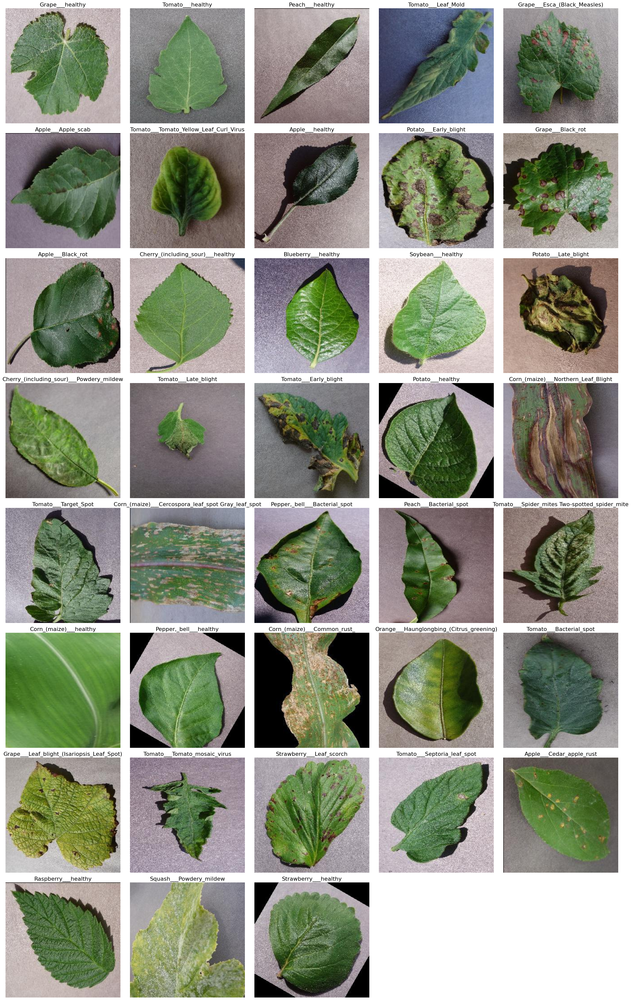

In [ ]:
# Set the default plot style for Matplotlib
plt.style.use('default')

# Determine how many classes there are to set up the subplot grid
class_folders = [d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))]
num_classes = len(class_folders)
cols = 5  # Number of columns in the subplot grid
rows = (num_classes + cols - 1) // cols  # Calculate required number of rows to accommodate all classes

# Adjust overall size to give each subplot enough space
plt.figure(figsize=(5 * cols, 5 * rows))

# Loop through each class directory to display example images
image_count = 1
for directory in class_folders:
    if directory[0] != '.':  # Skip hidden directories
        files = os.listdir(os.path.join(train_dir, directory))
        if files:
            file = files[0]  # Take the first file for demonstration
            fig = plt.subplot(rows, cols, image_count)
            image_count += 1
            image_path = os.path.join(train_dir, directory, file)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert image to RGB for displaying
            plt.imshow(image)
            plt.title(directory, fontsize=16)
            plt.axis('off')  # Hide axis

# Adjust layout to make the plot more readable
plt.tight_layout()
plt.show()

In [ ]:
class_dict = train_generator.class_indices
print(class_dict)

{'Apple___Apple_scab': 0, 'Apple___Black_rot': 1, 'Apple___Cedar_apple_rust': 2, 'Apple___healthy': 3, 'Blueberry___healthy': 4, 'Cherry_(including_sour)___Powdery_mildew': 5, 'Cherry_(including_sour)___healthy': 6, 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7, 'Corn_(maize)___Common_rust_': 8, 'Corn_(maize)___Northern_Leaf_Blight': 9, 'Corn_(maize)___healthy': 10, 'Grape___Black_rot': 11, 'Grape___Esca_(Black_Measles)': 12, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13, 'Grape___healthy': 14, 'Orange___Haunglongbing_(Citrus_greening)': 15, 'Peach___Bacterial_spot': 16, 'Peach___healthy': 17, 'Pepper,_bell___Bacterial_spot': 18, 'Pepper,_bell___healthy': 19, 'Potato___Early_blight': 20, 'Potato___Late_blight': 21, 'Potato___healthy': 22, 'Raspberry___healthy': 23, 'Soybean___healthy': 24, 'Squash___Powdery_mildew': 25, 'Strawberry___Leaf_scorch': 26, 'Strawberry___healthy': 27, 'Tomato___Bacterial_spot': 28, 'Tomato___Early_blight': 29, 'Tomato___Late_blight': 30, 'Tomato

## Preprocessing the Data Using 'ImageDataGenerator'

In [ ]:
# Define image dimensions and batch size
img_width, img_height = 150, 150
batch_size = 32

# Image Data Generator
# Define ImageDataGenerator objects for data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,          # Rescale pixel values to [0, 1]
    rotation_range=20,          # Randomly rotate images within a range of 20 degrees
    width_shift_range=0.2,      # Randomly shift images horizontally within 20% of the image width
    height_shift_range=0.2,     # Randomly shift images vertically within 20% of the image height
    shear_range=0.2,            # Randomly shear images within a range of 20%
    zoom_range=0.2,             # Randomly zoom images within a range of 20%
    horizontal_flip=True,       # Randomly flip images horizontally
    fill_mode='nearest'         # Fill empty pixels after augmentation using the 'nearest' method
)

valid_datagen = ImageDataGenerator(rescale=1./255)  # Only rescale pixel values for validation data
test_datagen = ImageDataGenerator(rescale=1./255)   # Only rescale pixel values for test data

# Data Generator for Train, Validation, and Test
# Create data generators for train, validation, and test sets using the defined ImageDataGenerators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),    # Resize images to the specified dimensions
    color_mode='rgb',
    batch_size=batch_size,                  # Set batch size for training
    class_mode='categorical',               # Use categorical class mode for multi-class classification
    shuffle=True
)

validation_generator = valid_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    color_mode='rgb',
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    color_mode='rgb',
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Verify some information from the generators
# Print information about the generators to verify the setup
print(f"Train Generator: {len(train_generator)} batches of {train_generator.batch_size} samples each.")
print(f"Validation Generator: {len(validation_generator)} batches of {validation_generator.batch_size} samples each.")
print(f"Test Generator: {len(test_generator)} batches of {test_generator.batch_size} samples each.")

Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.
Found 33 images belonging to 8 classes.
Train Generator: 2197 batches of 32 samples each.
Validation Generator: 550 batches of 32 samples each.
Test Generator: 2 batches of 32 samples each.


## Defining and Training CNN Model

In [ ]:
# Load the pre-trained VGG16 model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the pre-trained layers
for layer in base_model.layers[:-4]:
    layer.trainable = False

In [ ]:
# Define and configure the CNN model architecture with a pre-trained base model
def create_model(input_shape, num_classes):
    # Load the pre-trained base model (example: VGG16)
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

    # Add custom classification layers on top of the pre-trained base model
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Flatten()(x)
    x = Dropout(0.4)(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.2)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    # Create the final model
    model = Model(inputs=base_model.input, outputs=predictions)

    return model

# Create the model
model = create_model(input_shape=(img_width, img_height, 3), num_classes=len(train_generator.class_indices))

In [ ]:
# Print model summary
model.summary()

# Compile the model
model.compile(optimizer=Adam(learning_rate=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0   

In [ ]:
# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Define the ModelCheckpoint callback
checkpoint_filepath = 'best_model.h5'
checkpoint = ModelCheckpoint(checkpoint_filepath, monitor='val_accuracy', save_best_only=True, mode='max')

# Train the model with early stopping
epochs = 30
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    callbacks=[early_stopping, checkpoint]
)

Epoch 1/30
2197/2197 [==============================] - ETA: 0s - loss: 1.4543 - accuracy: 0.5908

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


2197/2197 [==============================] - 753s 340ms/step - loss: 1.4543 - accuracy: 0.5908 - val_loss: 0.3802 - val_accuracy: 0.8801
Epoch 2/30
2197/2197 [==============================] - 702s 319ms/step - loss: 0.4209 - accuracy: 0.8749 - val_loss: 0.2241 - val_accuracy: 0.9258
Epoch 3/30
2197/2197 [==============================] - 698s 317ms/step - loss: 0.2563 - accuracy: 0.9222 - val_loss: 0.1601 - val_accuracy: 0.9492
Epoch 4/30
2197/2197 [==============================] - 701s 319ms/step - loss: 0.1843 - accuracy: 0.9445 - val_loss: 0.1124 - val_accuracy: 0.9622
Epoch 5/30
2197/2197 [==============================] - 697s 317ms/step - loss: 0.1409 - accuracy: 0.9583 - val_loss: 0.1239 - val_accuracy: 0.9600
Epoch 6/30
2197/2197 [==============================] - 700s 319ms/step - loss: 0.1149 - accuracy: 0.9656 - val_loss: 0.0933 - val_accuracy: 0.9711
Epoch 7/30
2197/2197 [==============================] - 696s 317ms/step - loss: 0.0935 - accuracy: 0.9712 - val_loss: 0.089

## Evaluating the Model Using the Test Set

In [ ]:
# Add an empty class to the test data
dummy_labels = np.zeros((len(test_generator.filepaths), len(train_generator.class_indices)))

# Update labels according to the classes in the test data
for i, (images, labels) in enumerate(test_generator):
    dummy_labels[i*batch_size:(i+1)*batch_size, :labels.shape[1]] = labels
    if i == len(test_generator) - 1:
        break

# Replace label in test_generator
test_generator.classes = dummy_labels.argmax(axis=1)
test_generator.class_indices = train_generator.class_indices
test_generator.samples = len(test_generator.filepaths)

# Evaluation Model
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

2/2 [==============================] - 0s 23ms/step - loss: 26.8690 - accuracy: 0.0909
Test Loss: 26.86903190612793
Test Accuracy: 0.09090909361839294


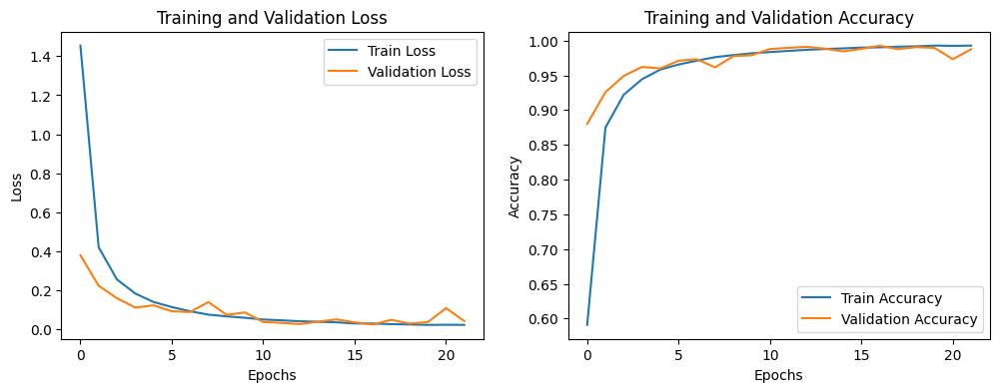

In [ ]:
# Plotting training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.show()

# Saving the Model

- H5

In [ ]:
# Save the model using H5 format
model.save('plants_disease_model.h5')

# Load the model using H5 format
from tensorflow.keras.models import load_model
loaded_model_h5 = load_model('plants_disease_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
